In [1]:
import os
os.environ["OMP_NUM_THREADS"] = '4'

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

In [31]:
df = pd.read_csv('train.csv', skipinitialspace=True) 
del df['features_duration_ms']
del df['popularity_confidence']
del df['processing']
del df['time_signature']
del df['mode']
del df['explicit']


df.head()

,name,duration_ms,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars,genre
0,Long Road,241760,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,0.0975,0.302000,0.53600,0.281,0.6350,142.221,567.0,141.0,j-dance
1,"Daniâl My Son, Where Did You Vanish?",444000,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0805,0.283000,0.93400,0.360,0.0336,75.596,617.0,155.0,iranian
2,Ondskapens Galakse,333506,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,0.0397,0.000089,0.80000,0.262,0.4890,116.628,652.0,162.0,black-metal
3,Can't Look Away,269800,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,0.0765,0.066400,0.00127,0.117,0.3850,140.880,619.0,155.0,bluegrass
4,Thunderground,307651,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,0.0539,0.000576,0.09690,0.299,0.6370,143.956,733.0,183.0,happy


In [3]:
df.shape

(15000, 18)

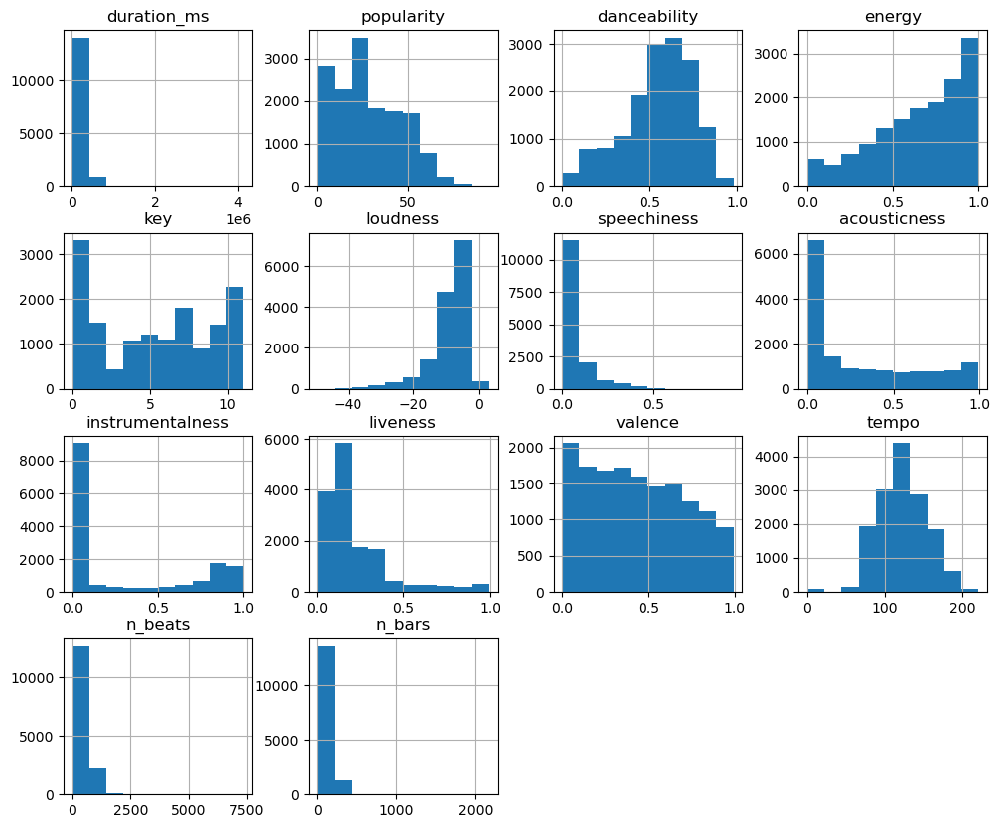

In [4]:
df.hist(figsize=(12, 10))
plt.show()

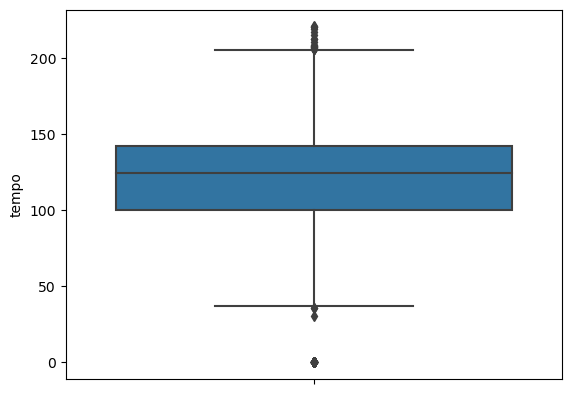

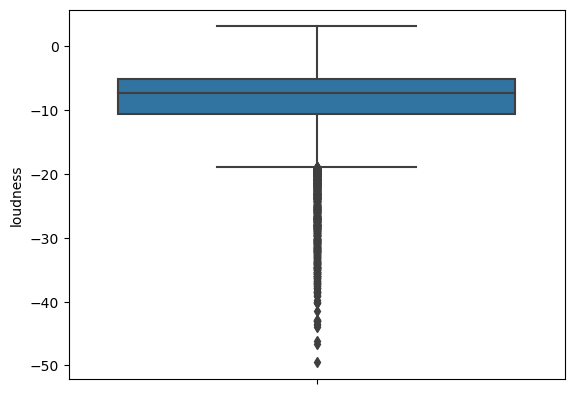

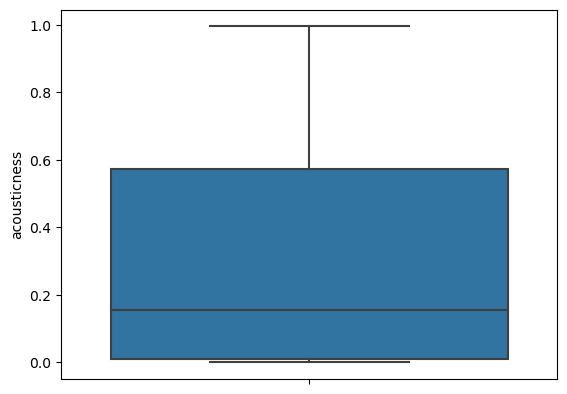

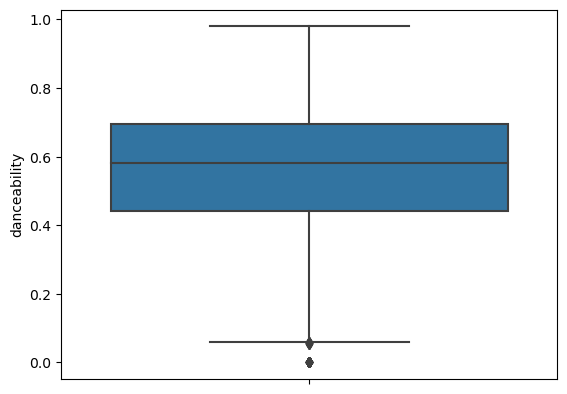

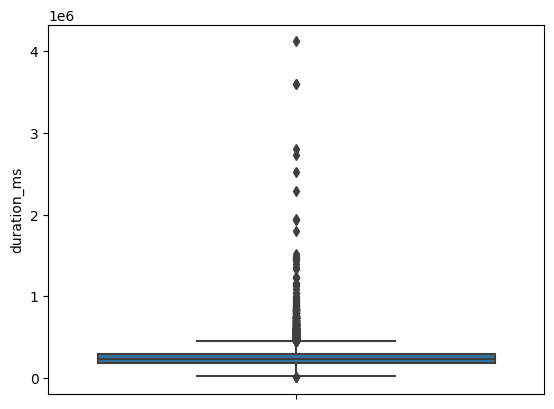

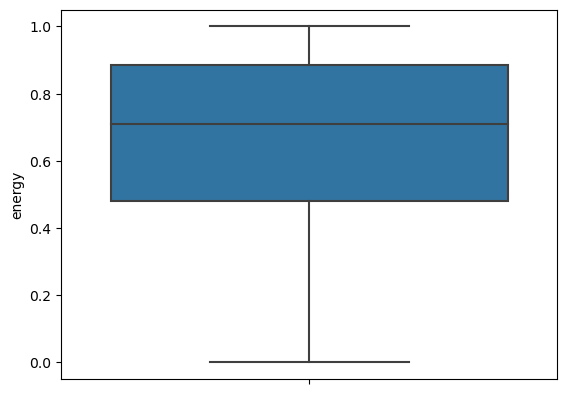

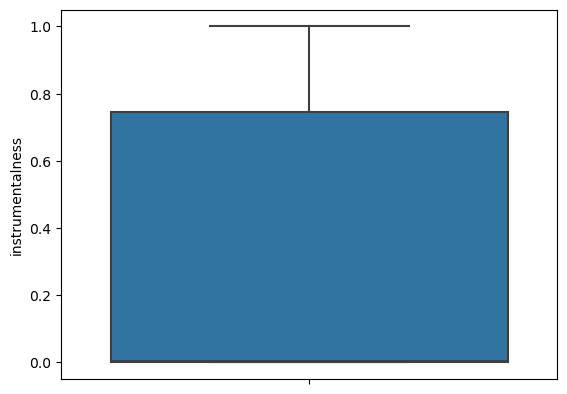

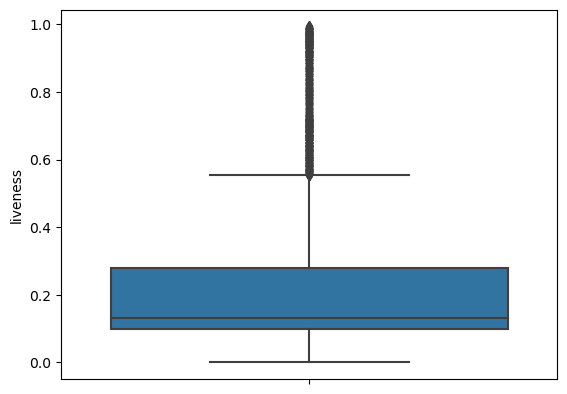

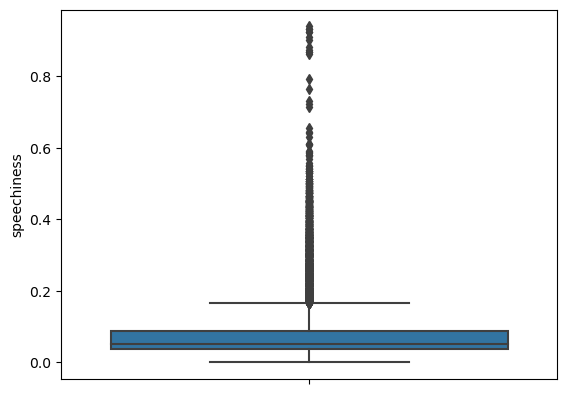

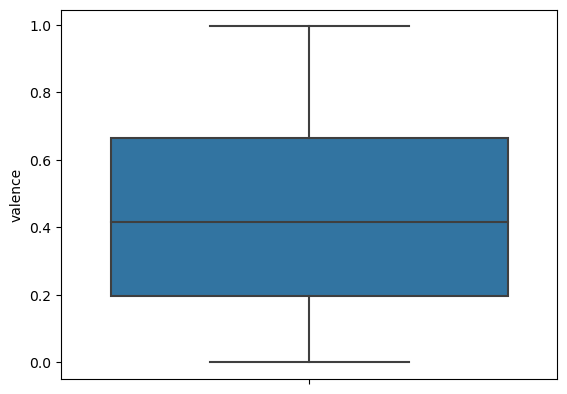

In [32]:
interestingFeatureColumns = ['tempo', 'loudness', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'valence']
for column in interestingFeatureColumns:
    sns.boxplot(y=column, data=df)
    plt.show()

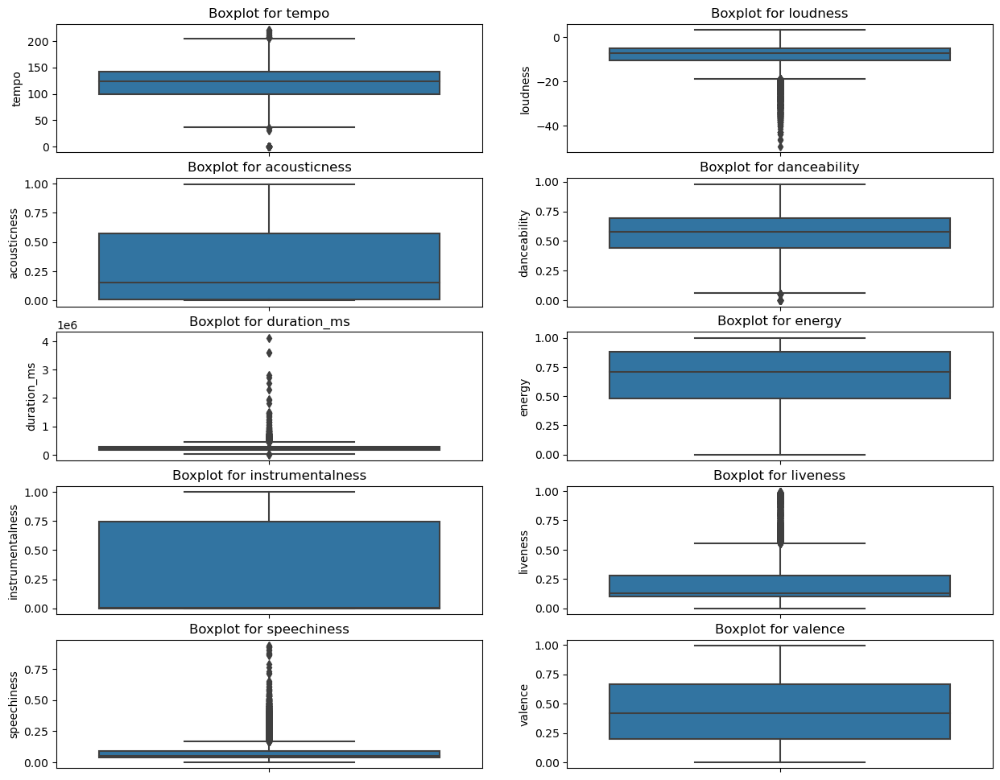

In [38]:
num_rows = (len(interestingFeatureColumns) + 1) // 2
num_cols = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 12))

# Flatten the axes array to make it easier to iterate
axes = axes.flatten()

# Loop through each interesting feature and create boxplots
for i, column in enumerate(interestingFeatureColumns):
    sns.boxplot(y=column, data=df, ax=axes[i])
    axes[i].set_title(f'Boxplot for {column}')

# If there are empty subplots, remove them
for j in range(len(interestingFeatureColumns), len(axes)):
    fig.delaxes(axes[j])

# Show the plot
plt.show()

### Divided duration by 1000 to get the values in smaller numbers

In [6]:
df['duration'] = df['duration_ms'] // 1000

# Remove the last column from the DataFrame
last_column = df.pop('duration')

df.insert(1, 'duration', last_column)

# Drop the original column from the DataFrame
df.drop('duration_ms', axis=1, inplace=True)

# Print the DataFrame
df.head()


,name,duration,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars,genre
0,Long Road,241,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,0.0975,0.302000,0.53600,0.281,0.6350,142.221,567.0,141.0,j-dance
1,"Daniâl My Son, Where Did You Vanish?",444,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0805,0.283000,0.93400,0.360,0.0336,75.596,617.0,155.0,iranian
2,Ondskapens Galakse,333,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,0.0397,0.000089,0.80000,0.262,0.4890,116.628,652.0,162.0,black-metal
3,Can't Look Away,269,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,0.0765,0.066400,0.00127,0.117,0.3850,140.880,619.0,155.0,bluegrass
4,Thunderground,307,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,0.0539,0.000576,0.09690,0.299,0.6370,143.956,733.0,183.0,happy


### Outlier removal

In [7]:
def remove_outliers(df, column_name, multiplier=1.5):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR

    df_no_outliers = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

    return df_no_outliers

In [8]:
z_threshold = 1.5

for column in df.columns:
    if np.issubdtype(df[column].dtype, np.number):
        df = remove_outliers(df, column, z_threshold)
        
df.shape

(10835, 18)

In [9]:
df.head()

,name,duration,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars,genre
0,Long Road,241,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,0.0975,0.302000,0.536000,0.281,0.635,142.221,567.0,141.0,j-dance
2,Ondskapens Galakse,333,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,0.0397,0.000089,0.800000,0.262,0.489,116.628,652.0,162.0,black-metal
3,Can't Look Away,269,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,0.0765,0.066400,0.001270,0.117,0.385,140.880,619.0,155.0,bluegrass
4,Thunderground,307,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,0.0539,0.000576,0.096900,0.299,0.637,143.956,733.0,183.0,happy
5,Sick Bubblegum,224,32,Rob Zombie,Hellbilly Deluxe 2 (Standard Explicit),0.642,0.972,5,-3.047,0.0967,0.001520,0.000024,0.384,0.421,118.035,432.0,106.0,industrial


#### Outliers have been eliminated

## Now we get the sample

In [10]:
sample_size = 1000  # Specify the desired sample size

# Use the sample() method to get a random sample of the DataFrame
sample = df.sample(n=sample_size, random_state=42)  # You can change the random_state for reproducibility

# Print or use the sample as needed
sample.head()

,name,duration,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars,genre
2476,Projections,248,4,BCee;Logistics;Becca Jane Grey,Liquicity Festival 2022,0.5610,0.866,6,-2.858,0.0403,0.000853,0.840,0.0374,0.2470,174.067,710.0,177.0,idm
11069,The Awakening - 2020 Edit,212,52,York;Scot & Millfield,The Awakening (2020 Edit),0.8480,0.870,11,-4.014,0.0395,0.172000,0.795,0.2470,0.2500,120.013,422.0,104.0,techno
5888,Equality,54,0,Najand,In the Night of Revolution,0.1670,0.963,4,0.377,0.0711,0.107000,0.692,0.3970,0.0310,106.265,91.0,23.0,iranian
2957,Midnight Sun,85,35,Nostalgique,Lofi Life,0.7330,0.355,0,-11.854,0.0369,0.287000,0.752,0.0895,0.2160,80.972,114.0,28.0,study
4467,The Devil Master (Devil is Your Master),135,16,Devil Master,Manifestations,0.0916,0.998,11,-5.353,0.1700,0.002290,0.160,0.5220,0.0615,173.833,397.0,99.0,black-metal


In [11]:
sample.reset_index(drop=True)

,name,duration,popularity,artists,album_name,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars,genre
0,Projections,248,4,BCee;Logistics;Becca Jane Grey,Liquicity Festival 2022,0.5610,0.866,6,-2.858,0.0403,0.000853,0.840000,0.0374,0.2470,174.067,710.0,177.0,idm
1,The Awakening - 2020 Edit,212,52,York;Scot & Millfield,The Awakening (2020 Edit),0.8480,0.870,11,-4.014,0.0395,0.172000,0.795000,0.2470,0.2500,120.013,422.0,104.0,techno
2,Equality,54,0,Najand,In the Night of Revolution,0.1670,0.963,4,0.377,0.0711,0.107000,0.692000,0.3970,0.0310,106.265,91.0,23.0,iranian
3,Midnight Sun,85,35,Nostalgique,Lofi Life,0.7330,0.355,0,-11.854,0.0369,0.287000,0.752000,0.0895,0.2160,80.972,114.0,28.0,study
4,The Devil Master (Devil is Your Master),135,16,Devil Master,Manifestations,0.0916,0.998,11,-5.353,0.1700,0.002290,0.160000,0.5220,0.0615,173.833,397.0,99.0,black-metal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Dont Cry,213,5,Bugle,Dont Cry,0.6310,0.512,11,-7.505,0.0750,0.580000,0.000010,0.1360,0.4080,107.767,382.0,96.0,j-dance
996,Run Away (feat. Campaign Nino),192,14,Kyle Edwards;Karium K.E. Edwards;Wakyin;Campai...,Run Away (feat. Campaign Nino),0.8090,0.788,10,-5.127,0.0457,0.354000,0.090500,0.1810,0.4650,126.056,401.0,99.0,techno
997,Something in the Water,139,9,downstairs lantern,Flowers in Your Eyes,0.5970,0.532,9,-8.575,0.0942,0.277000,0.885000,0.1260,0.7210,114.214,262.0,65.0,study
998,Perder para Encontrar,208,28,Benny,La Marcha de la Vida,0.6600,0.783,0,-7.430,0.0328,0.191000,0.000058,0.0993,0.6580,102.869,350.0,87.0,spanish


In [12]:
sample.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 2476 to 8983
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              1000 non-null   object 
 1   duration          1000 non-null   int64  
 2   popularity        1000 non-null   int64  
 3   artists           1000 non-null   object 
 4   album_name        1000 non-null   object 
 5   danceability      1000 non-null   float64
 6   energy            1000 non-null   float64
 7   key               1000 non-null   int64  
 8   loudness          1000 non-null   float64
 9   speechiness       1000 non-null   float64
 10  acousticness      1000 non-null   float64
 11  instrumentalness  1000 non-null   float64
 12  liveness          1000 non-null   float64
 13  valence           1000 non-null   float64
 14  tempo             1000 non-null   float64
 15  n_beats           1000 non-null   float64
 16  n_bars            1000 non-null   float64
 1

In [13]:
my_sample = sample.select_dtypes(exclude=[object])
my_sample.head()

,duration,popularity,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars
2476,248,4,0.5610,0.866,6,-2.858,0.0403,0.000853,0.840,0.0374,0.2470,174.067,710.0,177.0
11069,212,52,0.8480,0.870,11,-4.014,0.0395,0.172000,0.795,0.2470,0.2500,120.013,422.0,104.0
5888,54,0,0.1670,0.963,4,0.377,0.0711,0.107000,0.692,0.3970,0.0310,106.265,91.0,23.0
2957,85,35,0.7330,0.355,0,-11.854,0.0369,0.287000,0.752,0.0895,0.2160,80.972,114.0,28.0
4467,135,16,0.0916,0.998,11,-5.353,0.1700,0.002290,0.160,0.5220,0.0615,173.833,397.0,99.0


#### Correlation matrix 

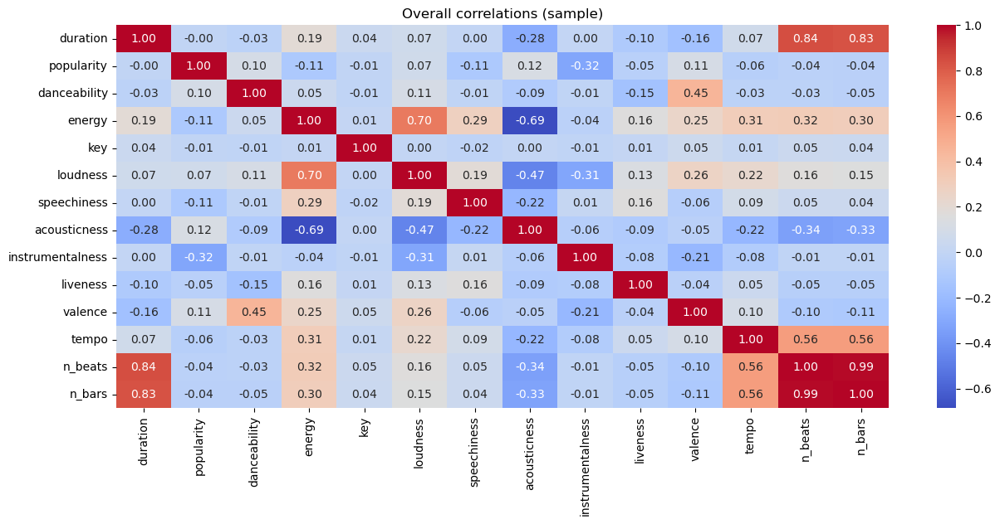

In [14]:
#sample correlation matrix

plt.figure(figsize=(15,6))
sns.heatmap(my_sample.corr(), cmap='coolwarm', fmt=".2f", annot=True)

plt.title('Overall correlations (sample)')
plt.show()

In [15]:
my_df = df.select_dtypes(exclude=[object])

In [16]:
my_df.head()

,duration,popularity,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars
0,241,46,0.690,0.513,5,-12.529,0.0975,0.302000,0.536000,0.281,0.635,142.221,567.0,141.0
2,333,3,0.363,0.854,2,-7.445,0.0397,0.000089,0.800000,0.262,0.489,116.628,652.0,162.0
3,269,23,0.523,0.585,5,-5.607,0.0765,0.066400,0.001270,0.117,0.385,140.880,619.0,155.0
4,307,25,0.643,0.687,7,-11.340,0.0539,0.000576,0.096900,0.299,0.637,143.956,733.0,183.0
5,224,32,0.642,0.972,5,-3.047,0.0967,0.001520,0.000024,0.384,0.421,118.035,432.0,106.0


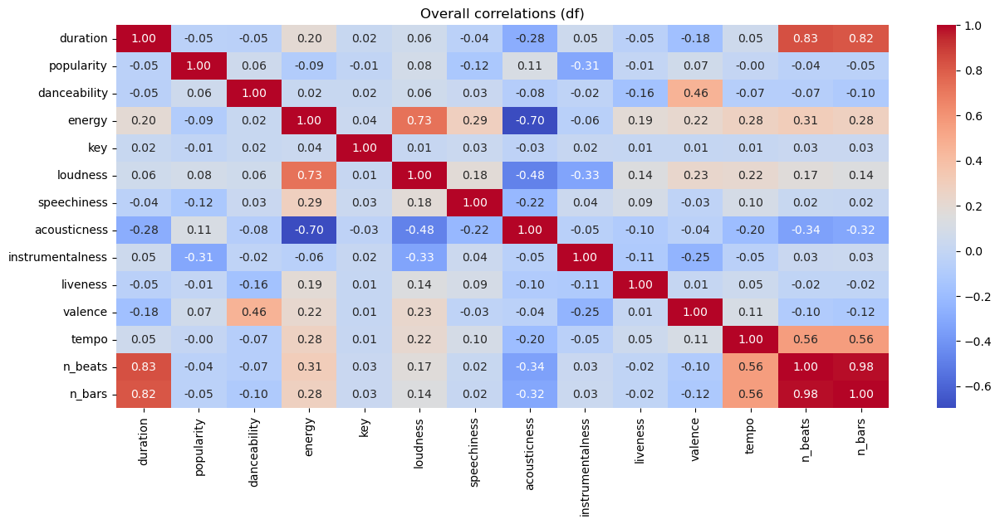

In [17]:
# Original DF correlation matrix

plt.figure(figsize=(15,6))
sns.heatmap(my_df.corr(), cmap='coolwarm', fmt=".2f", annot=True)

plt.title('Overall correlations (df)')
plt.show()

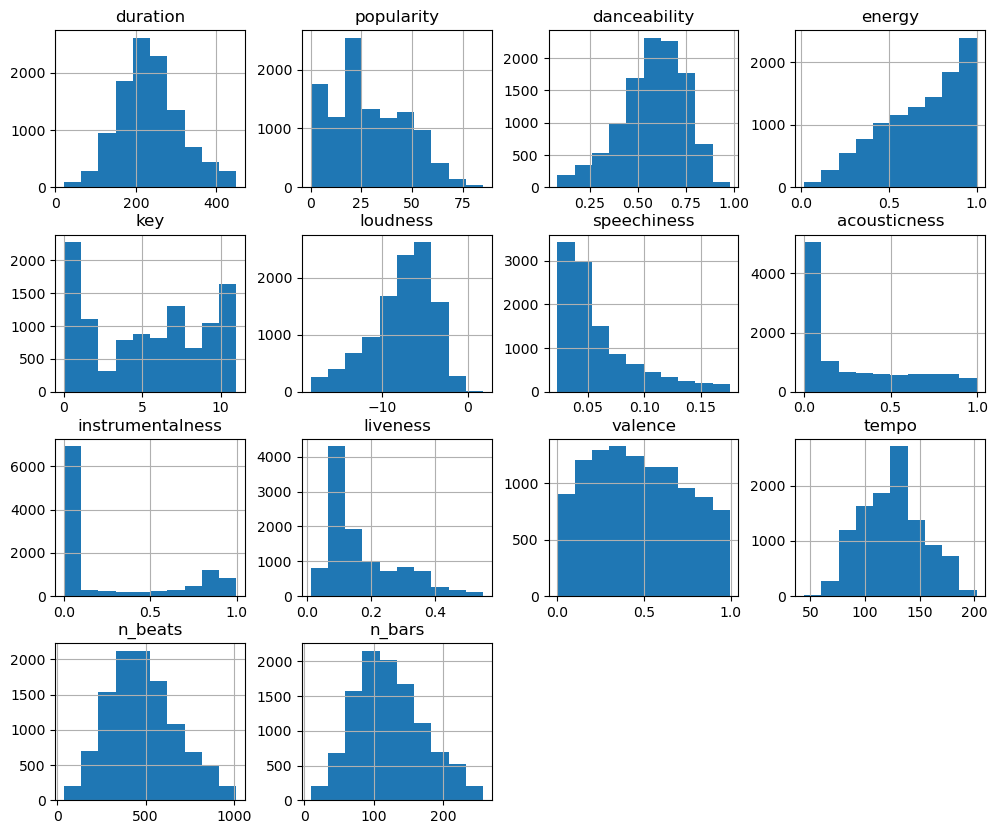

In [18]:
df.hist(figsize=(12, 10))
plt.show()

C:\Users\javie\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\javie\AppData\Local\Temp\ipykernel_13380\1862385663.py:3: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


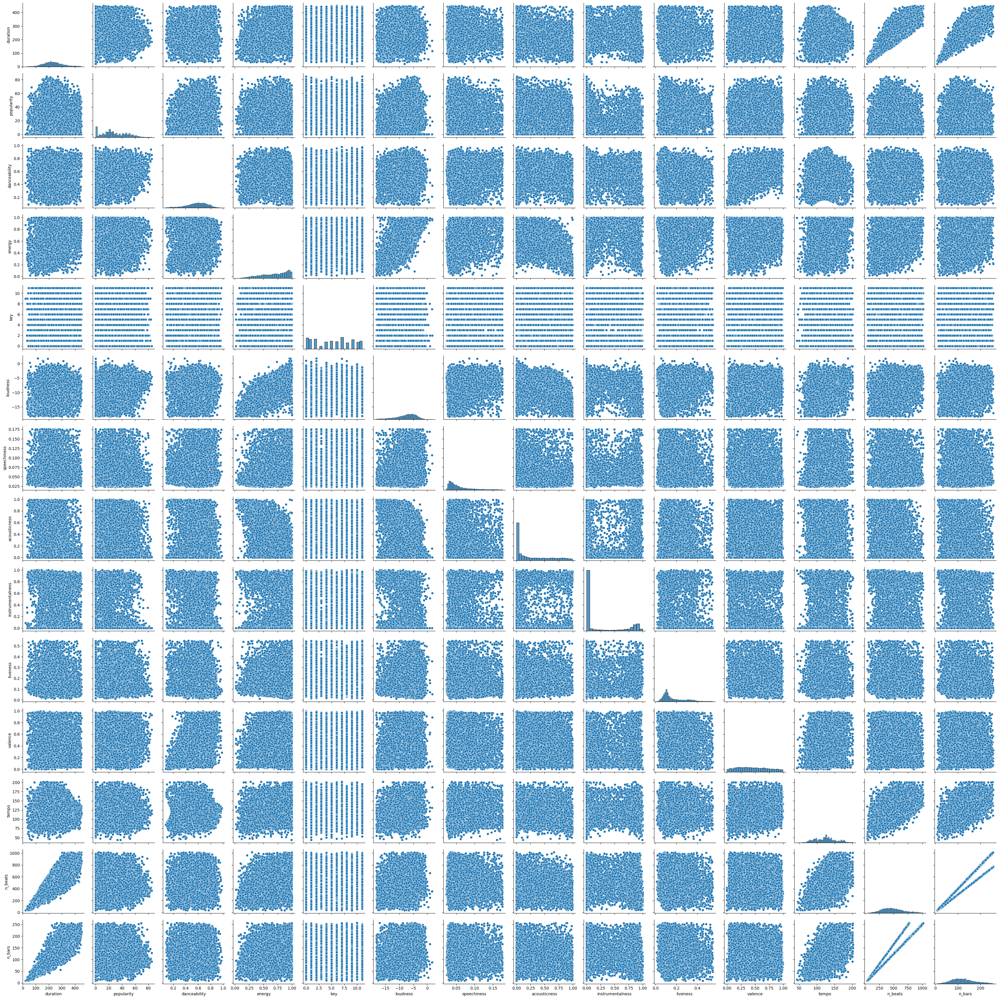

In [19]:
# original df's pairplot
sns.pairplot(df)
plt.tight_layout()
plt.show()

C:\Users\javie\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\javie\AppData\Local\Temp\ipykernel_13380\3528053519.py:4: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


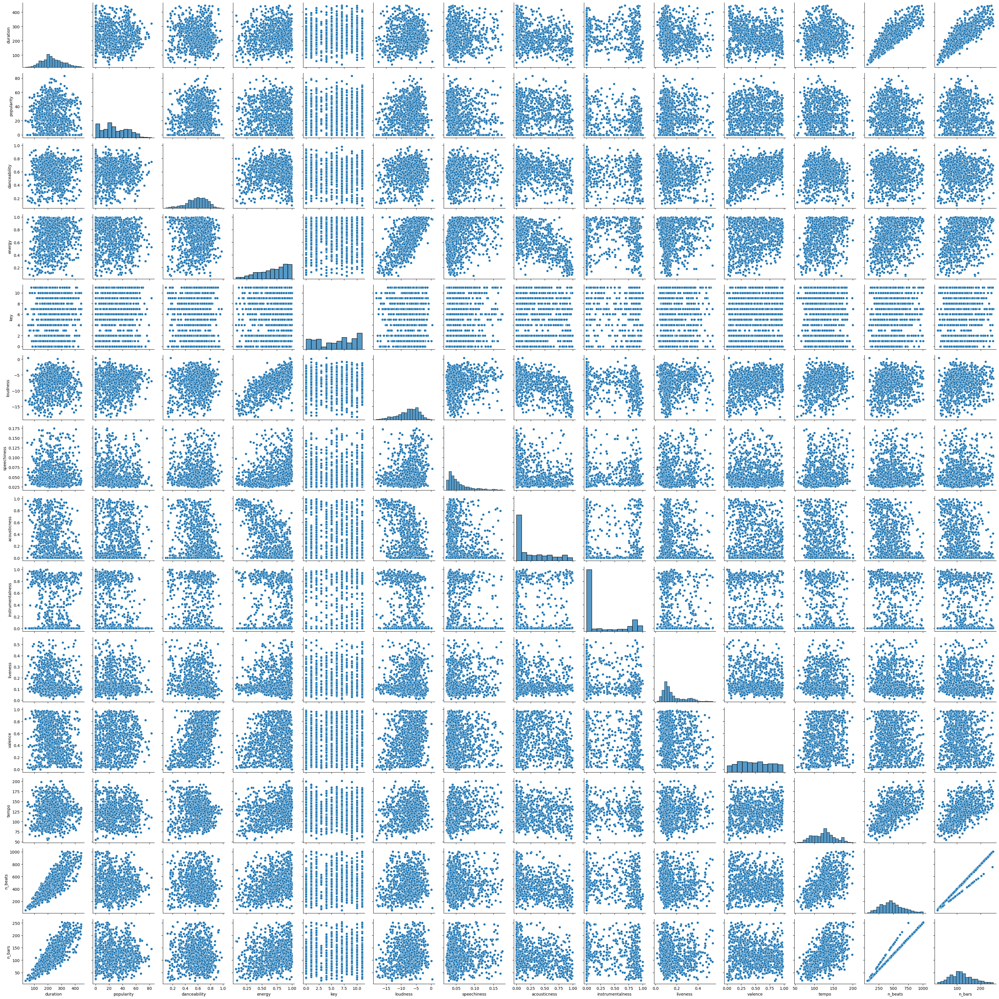

In [20]:
# sample's pairplot

sns.pairplot(my_sample)
plt.tight_layout()
plt.show()

In [21]:
my_sample.to_csv("sample_1000.csv", index=False)

In [22]:
sample.to_csv("sample_genre_1000.csv", index=False)

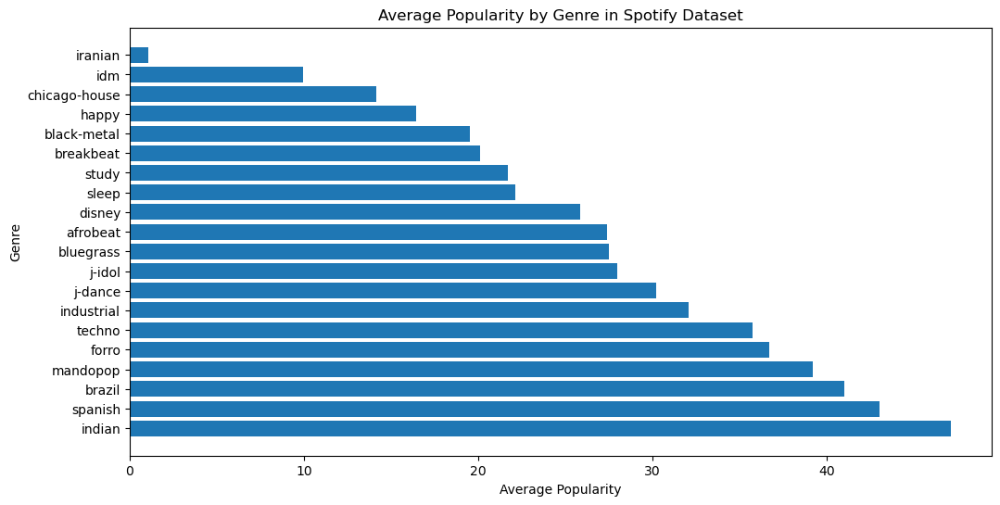

In [23]:
genre_popularity = sample.groupby('genre')['popularity'].mean().reset_index()

# Sort the data by average popularity (optional)
genre_popularity = genre_popularity.sort_values(by='popularity', ascending=False)

# Create a bar plot to visualize the average popularity by genre
plt.figure(figsize=(12, 6))
plt.barh(genre_popularity['genre'], genre_popularity['popularity'])
plt.xlabel('Average Popularity')
plt.ylabel('Genre')
plt.title('Average Popularity by Genre in Spotify Dataset')

# Display the plot
plt.show()

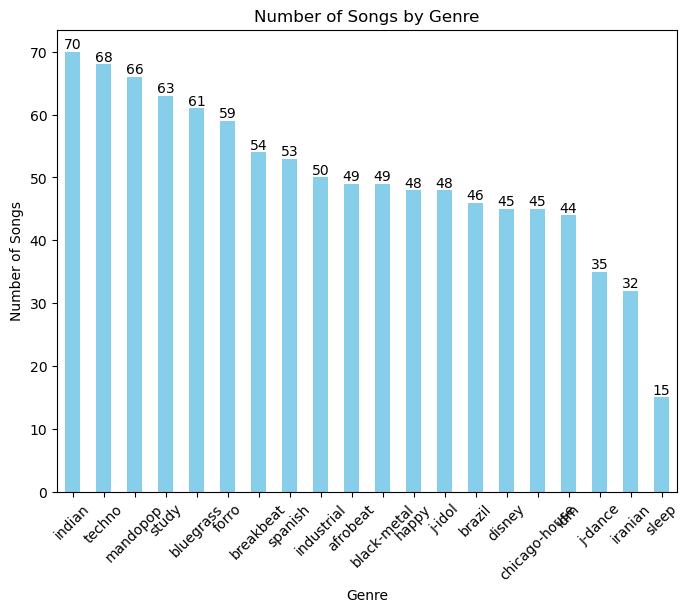

In [24]:
genre_counts = sample['genre'].value_counts()

plt.figure(figsize=(8, 6))
genre_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Songs by Genre')
plt.xlabel('Genre')
plt.ylabel('Number of Songs')

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
for i, value in enumerate(genre_counts):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.show()

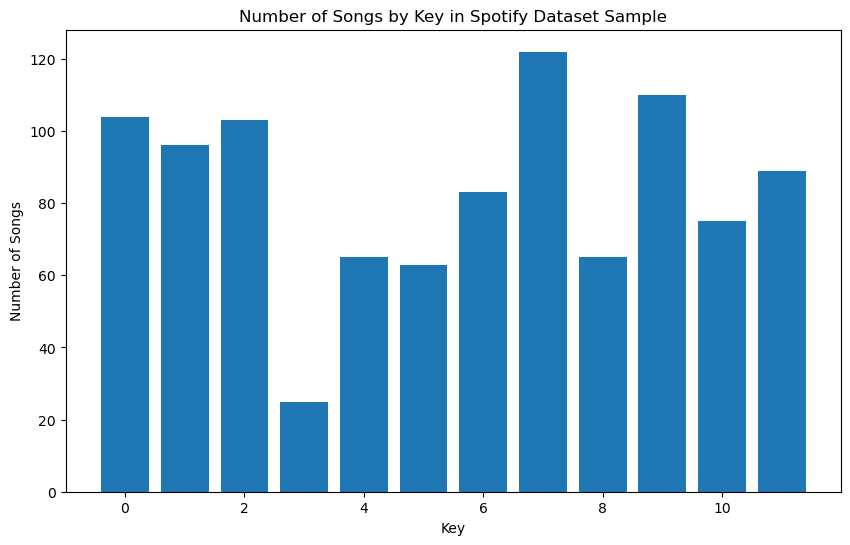

In [25]:
key_counts = sample['key'].value_counts().reset_index()
key_counts.columns = ['Key', 'Count']

# Sort the data by 'Key' (optional)
key_counts = key_counts.sort_values(by='Key')


# Create a bar chart to visualize the number of songs by 'key'
plt.figure(figsize=(10, 6))
plt.bar(key_counts['Key'], key_counts['Count'])
plt.xlabel('Key')
plt.ylabel('Number of Songs')
plt.title('Number of Songs by Key in Spotify Dataset Sample')

# Display the plot
plt.show()

